# Analyzing Lava Flow Velocity with Python
#### Jasper Baur - RCES Final Project

In [93]:
import pandas as pd
import xarray as xr
import numpy as np
import fsspec
import h5netcdf

import urllib
import urllib.request
from urllib.request import urlopen


import IPython ## 
from IPython import display
display.set_matplotlib_formats('retina')
from IPython.display import Video
from IPython.display import YouTubeVideo
from IPython.display import Image
from IPython.core.display import HTML


import matplotlib.pyplot as plt 
from matplotlib import ticker, cm
%matplotlib inline  
%config InlineBackend.figure_format = "retina"
import matplotlib.image as mpimg
from matplotlib.pyplot import figure
from matplotlib import animation


!pip install 'git+git://github.com/tjcrone/gdrivefs.git@540a55fae06cbed4f7d9f8d540ac29fcb640c38a'
import gdrivefs

  Cloning git://github.com/tjcrone/gdrivefs.git (to revision 540a55fae06cbed4f7d9f8d540ac29fcb640c38a) to /tmp/pip-req-build-wnz9hkhu
  Created wheel for gdrivefs: filename=gdrivefs-0+untagged.18.g540a55f-py3-none-any.whl size=7302 sha256=e71776b8784671f00cb6ee3a785a6be05b6d169b675395578c4bfcf93516c9f0
  Stored in directory: /home/jovyan/.cache/pip/wheels/15/4c/f1/4e7c595331abdbc521e37b85bfe0bac4d9ade7a651260cb97f
Successfully built gdrivefs


### Drone Video Raw Data example
Clip of UAS Flight 7 on 26th July 2018, at the Kilauea Lower East Rift Zone captured by the USGS HVO

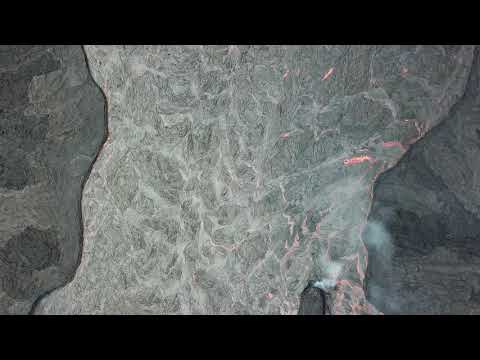

In [94]:
idd = 'TmSK4a4tl84'

YouTubeVideo(id=idd, width=900, height=600)

### Distilled Image Frames
#### Produced with Script 1_Video_to_Frame 

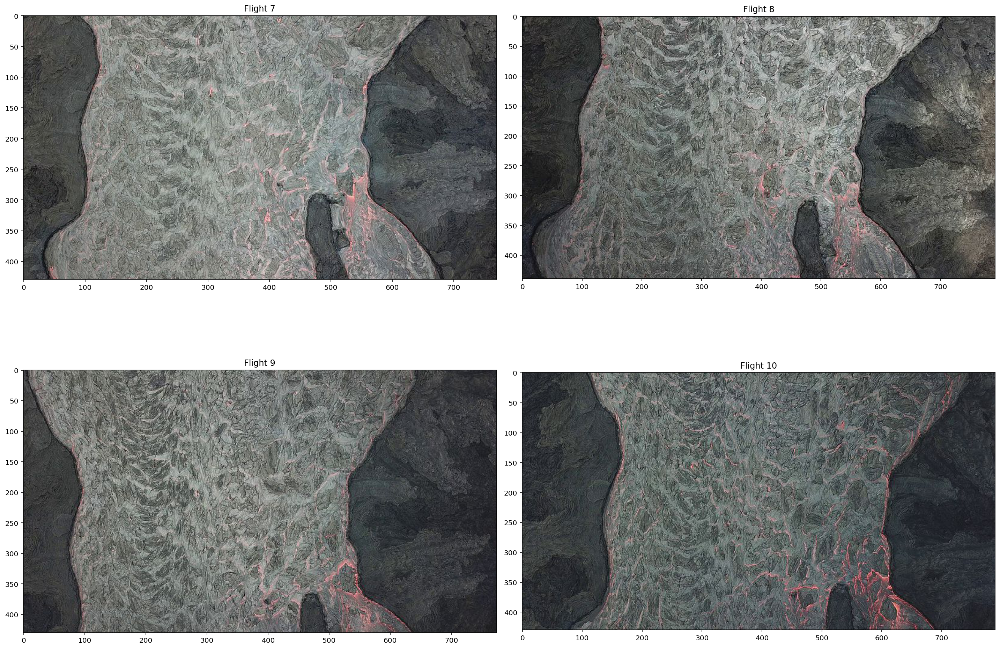

In [95]:
frame_F7 = urlopen("https://static.wixstatic.com/media/066c76_50af7af1a5a94f0aa3cb271b6184fb5f~mv2.jpg/v1/fill/w_770,h_430,al_c,q_80,usm_0.66_1.00_0.01/Site_6_F07_Still_001.jpg")
frame_F7 = plt.imread(frame_F7 , format='jpg')

frame_F8  = urlopen("https://static.wixstatic.com/media/066c76_ddeb0ae6cbee48d8a1836c89d2ba2745~mv2.jpg/v1/fill/w_792,h_440,al_c,q_80,usm_0.66_1.00_0.01/Site_6_F08_Still_001.jpg")
frame_F8  = plt.imread(frame_F8 , format='jpg')

frame_F9  = urlopen("https://static.wixstatic.com/media/066c76_046d0e1295eb447eb9773ce2d12cefc7~mv2.jpg/v1/fill/w_774,h_430,al_c,q_80,usm_0.66_1.00_0.01/Site_6_F09_Still_001.jpg")
frame_F9  = plt.imread(frame_F9 , format='jpg')

frame_F10 = urlopen("https://static.wixstatic.com/media/066c76_a8ac6473ace44899a98d15da641c0f71~mv2.jpg/v1/fill/w_790,h_430,al_c,q_80,usm_0.66_1.00_0.01/Site_6_F10_Still_001.jpg")
frame_F10 = plt.imread(frame_F10 , format='jpg')


fig,ax = plt.subplots(2,2,figsize=(20,15))
ax[0,0].imshow(frame_F7)
ax[0,0].set_title('Flight 7')
ax[0,1].imshow(frame_F8)
ax[0,1].set_title('Flight 8')
ax[1,0].imshow(frame_F9)
ax[1,0].set_title('Flight 9')
ax[1,1].imshow(frame_F10)
ax[1,1].set_title('Flight 10')
plt.tight_layout()

## Turning Frames into Velocity Fields (csv files) then builing an Xarray and cleaning the data
#### Script:  2_Frames_to_PIV : Velocity Fields Generated with OpenPIV - Particle Image Velocimetry 
#### Script:  3_PIV_to_Xarray : Xarray built

To access data click link
'https://drive.google.com/drive/folders/1oVIuvti11dBUmHZYhcskmi8HZL38j-q3?usp=sharing'

### Make Conversions to real world units
- From Pixels/frame to Meters/Second
- Part of Script 3_PIV_to_Xarray but we will use the GSD later

In [96]:
AGL = 304.8 # meters ABove ground level 
FOV = np.deg2rad(78.8) #degrees (Field of View)
Aspect =  2160/3840   #aspect ratio 16:9 (Pixel Height/ Pixel Width of Image)

D =   2 * AGL *np.tan(FOV/2) #diagnol of image

A = (D) / np.sqrt(1 + Aspect**2)
B = Aspect * D / np.sqrt(1 + Aspect**2)
print('Image Footprint:',A, 'm x', B, 'm')

PixelX = 3840
PixelY = 2180


GSDx = A/ PixelX #(Ground Sampling Distance of x direction)
GSDy = B/ PixelY #(Ground Sampling Distance of y direction)

print('Ground Sampling Distance:', 'x:', GSDx, 'y:', GSDy)

Image Footprint: 436.4249645610448 m x 245.4890425655877 m
Ground Sampling Distance: x: 0.11365233452110542 y: 0.11260965255302188


## Load in Corrected Xarray dataset

In [97]:
#Pull From Google drive
#https://drive.google.com/drive/u/3/folders/1Hly2lA3gg9HvbmMxH7wt4aTDTY-BzFg0
gdfidXR = '1Hly2lA3gg9HvbmMxH7wt4aTDTY-BzFg0'
gdfsXR = gdrivefs.GoogleDriveFileSystem(root_file_id=gdfidXR, token ='cache')
filesXr = gdfsXR.ls('')

dfx = xr.open_dataset(gdfsXR.open(filesXr[0]))

In [98]:
dfx.load()

<xarray.Dataset>
Dimensions:  (Flight: 4, time: 120, x: 119, y: 66)
Coordinates:
  * time     (time) int64 0 1 2 3 4 5 6 7 8 ... 112 113 114 115 116 117 118 119
  * y        (y) float64 3.604 7.207 10.81 14.41 ... 227.0 230.6 234.2 237.8
  * x        (x) float64 3.637 7.274 10.91 14.55 ... 421.9 425.5 429.2 432.8
  * Flight   (Flight) object 'F07' 'F08' 'F09' 'F10'
Data variables:
    u        (Flight, time, x, y) float64 -0.03656 -0.005431 ... -0.1262 -0.1295
    v        (Flight, time, x, y) float64 0.02105 0.0419 ... 0.01729 0.01486
    s        (Flight, time, x, y) float64 0.04219 0.04225 ... 0.1274 0.1303

### Metadata 
#### Location: Site 6
Latitude: 19.476251  
Longitude: -154.899143


#### Date:  26 July 2018 
Start and end times HST

Flight 07: 12:53	13:08

Flight 08: 13:19	13:35

Flight 09: 13:48	14:05

Flight 10: 14:25	14:40

- Flights trimed to 2:00 min in pre-processing

### Xarray: 4 flights (F07, F08, F09, F10) each with 120 seconds 
- Each time has it's own velocity field
### Variables include 
- u: cross-stream velocity (- is left, + is right) (m/s)
- v: downstream velocity (m/s)
- s: total velocity (m/s)

### Data cleaning consisted of:
1. Combine all Flights into one Dataset with new dimension (Flight)
2. Make Conversions to real world units - From Pixels/frame to Meters/Second
3. Correcting For Drone Motion by subtracting out 'still region' velocities from entire field for each frame in each flight - this accounts for small drone motions cause by wind or turbulence
4. Add total velocity -  s = sqrt(u^2 + v^2)
5. Correct for spikes and drop outs with where function

### Select By Flights - Binder

In [ ]:
F07 = dfx.sel(Flight= b'F07')
F08 = dfx.sel(Flight= b'F08')
F09 = dfx.sel(Flight= b'F09')
F10 = dfx.sel(Flight= b'F10')

### Select by Flight - JupyterNotebook

In [99]:
F07 = dfx.sel(Flight= 'F07')
F08 = dfx.sel(Flight= 'F08')
F09 = dfx.sel(Flight= 'F09')
F10 = dfx.sel(Flight= 'F10')

# Visualizing the Data

## Plots with time-mean velocities

#### Average Velocity, Average Downstream velocity, Maximum downstream veocity, Average cross-stream velocity

/srv/conda/envs/notebook/lib/python3.7/site-packages/xarray/plot/utils.py:624: MatplotlibDeprecationWarning: The 'extend' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(primitive, **cbar_kwargs)


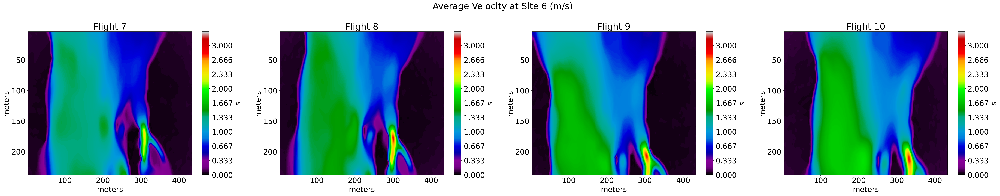

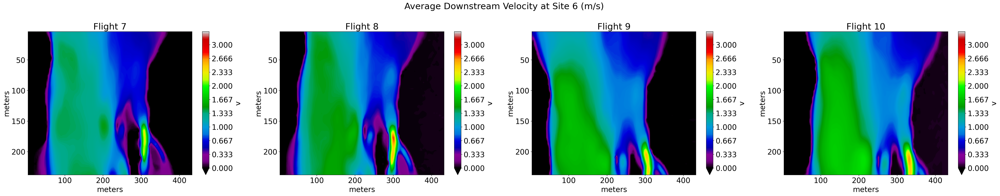

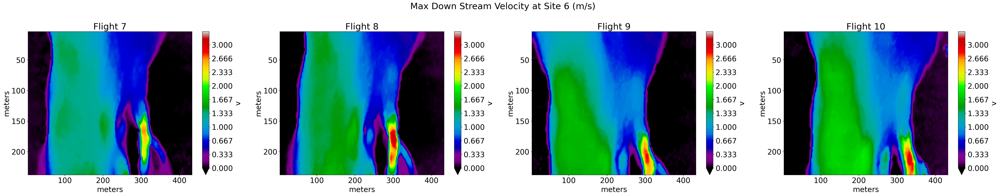

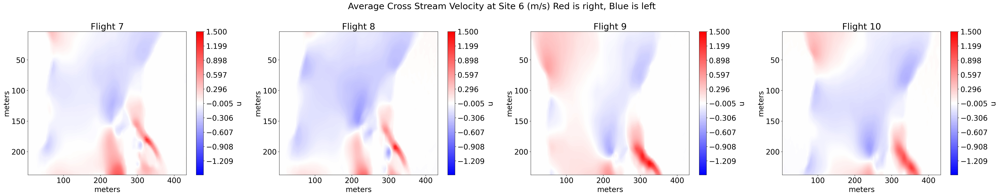

In [100]:
plt.rcParams.update({'font.size': 21})

# Average Velocity
fig1, axes = plt.subplots(figsize=(40, 8), ncols=4, )
ax1, ax2, ax3, ax4 =axes

plt.suptitle("Average Velocity at Site 6 (m/s)")

F7_cor_s = F07.s
F7_cor_s.mean(dim='time').transpose().plot.contourf(levels=300, vmin=0, vmax=3.322, cmap=cm.nipy_spectral, ax=axes[0], yincrease=False)
ax1.set_title('Flight 7')
ax1.set_xlabel('meters')
ax1.set_ylabel('meters')
#ax1.set_xticks([0, .5, 1, 1.5, 2, 2.5, 3])


F8_cor_s = F08.s 
F8_cor_s.mean(dim='time').transpose().plot.contourf(levels=300, vmin=0, vmax=3.322, cmap=cm.nipy_spectral, ax=axes[1], yincrease=False)
ax2.set_title('Flight 8')
ax2.set_xlabel('meters')
ax2.set_ylabel('meters')

F9_cor_s = F09.s 
F9_cor_s.mean(dim='time').transpose().plot.contourf(levels=300, vmin=0, vmax=3.322, cmap=cm.nipy_spectral, ax=axes[2], yincrease=False)
#plt.gca().invert_yaxis()
ax3.set_title('Flight 9')
ax3.set_xlabel('meters')
ax3.set_ylabel('meters')

F10_cor_s = F10.s
F10_cor_s.mean(dim='time').transpose().plot.contourf(levels=300, vmin=0, vmax=3.322, cmap=cm.nipy_spectral, ax=axes[3], yincrease=False)
ax4.set_title('Flight 10')
ax4.set_xlabel('meters')
ax4.set_ylabel('meters')
plt.tight_layout()


# Mean Down Stream Velocity
fig2, axes = plt.subplots(figsize=(40, 8), ncols=4, )
ax1, ax2, ax3, ax4 =axes

plt.suptitle(" Average Downstream Velocity at Site 6 (m/s)")


F07.v.mean(dim='time').transpose().plot.contourf(levels=300, vmin=0, vmax=3.322, cmap=cm.nipy_spectral, ax=axes[0], yincrease=False)
ax1.set_title('Flight 7')
ax1.set_xlabel('meters')
ax1.set_ylabel('meters')

F08.v.mean(dim='time').transpose().plot.contourf(levels=300, vmin=0, vmax=3.322, cmap=cm.nipy_spectral, ax=axes[1], yincrease=False)
ax2.set_title('Flight 8')
ax2.set_xlabel('meters')
ax2.set_ylabel('meters')

F09.v.mean(dim='time').transpose().plot.contourf(levels=300, vmin=0, vmax=3.322, cmap=cm.nipy_spectral, ax=axes[2], yincrease=False)
ax3.set_title('Flight 9')
ax3.set_xlabel('meters')
ax3.set_ylabel('meters')

F10.v.mean(dim='time').transpose().plot.contourf(levels=300, vmin=0, vmax=3.322, cmap=cm.nipy_spectral, ax=axes[3], yincrease=False)
ax4.set_title('Flight 10')
ax4.set_xlabel('meters')
ax4.set_ylabel('meters')
plt.tight_layout()

#Max downstream Velocity
fig3, axes = plt.subplots(figsize=(40, 8), ncols=4, )
ax1, ax2, ax3, ax4 =axes

plt.suptitle("Max Down Stream Velocity at Site 6 (m/s)")

# Due to drone motion, positively interfering with down stream velocity, we need to make a corrections
Cor_F07 = F07.v.max(dim='time') -.1
Cor_F07.transpose().plot.contourf(levels=300, vmin=0, vmax=3.322, cmap=cm.nipy_spectral, ax=axes[0], yincrease=False)
ax1.set_title('Flight 7')
ax1.set_xlabel('meters')
ax1.set_ylabel('meters')

Cor_F08 = F08.v.max(dim='time') -.1
Cor_F08.transpose().plot.contourf(levels=300, vmin=0, vmax=3.322, cmap=cm.nipy_spectral, ax=axes[1], yincrease=False)
ax2.set_title('Flight 8')
ax2.set_xlabel('meters')
ax2.set_ylabel('meters')

Cor_F09 = F09.v.max(dim='time') -.1
Cor_F09.transpose().plot.contourf(levels=300, vmin=0, vmax=3.322, cmap=cm.nipy_spectral, ax=axes[2], yincrease=False)
ax3.set_title('Flight 9')
ax3.set_xlabel('meters')
ax3.set_ylabel('meters')

Cor_F10 = F10.v.max(dim='time') -.1
Cor_F10.transpose().plot.contourf(levels=300, vmin=0, vmax=3.322, cmap=cm.nipy_spectral, ax=axes[3], yincrease=False)
ax4.set_title('Flight 10')
ax4.set_xlabel('meters')
ax4.set_ylabel('meters')
plt.tight_layout()

# Mean Cross Stream Velocity
fig4, axes = plt.subplots(figsize=(40, 8), ncols=4, )
ax1, ax2, ax3, ax4 =axes

plt.suptitle("Average Cross Stream Velocity at Site 6 (m/s) Red is right, Blue is left")

F07.u.mean(dim='time').transpose().plot.contourf(levels=300, vmin= -1.5, vmax=1.5, cmap=cm.bwr, ax=axes[0], yincrease=False)
ax1.set_title('Flight 7')
ax1.set_xlabel('meters')
ax1.set_ylabel('meters')

F08.u.mean(dim='time').transpose().plot.contourf(levels=300, vmin= -1.5, vmax=1.5, cmap=cm.bwr, ax=axes[1], yincrease=False)
ax2.set_title('Flight 8')
ax2.set_xlabel('meters')
ax2.set_ylabel('meters')

F09.u.mean(dim='time').transpose().plot.contourf(levels=300, vmin= -1.5, vmax=1.5, cmap=cm.bwr, ax=axes[2], yincrease=False)
ax3.set_title('Flight 9')
ax3.set_xlabel('meters')
ax3.set_ylabel('meters')

F10.u.mean(dim='time').transpose().plot.contourf(levels=300, vmin= -1.5, vmax=1.5, cmap=cm.bwr, ax=axes[3], yincrease=False)
ax4.set_title('Flight 10')
ax4.set_xlabel('meters')
ax4.set_ylabel('meters')
plt.tight_layout()

# Analysis

## Plots of Velocity through time at each channel

Mean thoughout time for the red dot is 2.1921096558795776 m/s
Mean thoughout time for the blue dot is 1.3448816446005822 m/s


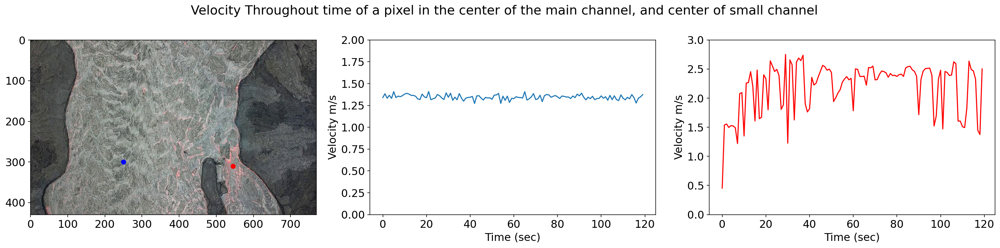

In [114]:
plt.rcParams.update({'font.size': 15})

Large = F07.v.sel(x=150, y=150, method='nearest')
Resize =.2

fig,ax = plt.subplots(1,3,figsize=(20,5))
ax[0].imshow(frame_F7,  aspect='auto')
ax[0].plot(250, 300, 'bo')
ax[0].plot(545,310, 'ro')


ax[1].plot(F07.time, Large)
ax[1].set_ylabel('Velocity m/s')
ax[1].set_xlabel('Time (sec)')
ax[1].set_ylim(0,2)

plt.suptitle("Velocity Throughout time of a pixel in the center of the main channel, and center of small channel")
plt.tight_layout()

# Pixel at center of smaller channel throughout 2 minutes 
Small = F07.v.sel(x=307, y=165, method='nearest')
ax[2].plot(F07.time, Small, color='red')
ax[2].set_ylim(0,3)
ax[2].set_ylabel('Velocity m/s')
ax[2].set_xlabel('Time (sec)')
#ax[2].set_title("Velocity Throughout time of a pixel in the center of the smaller channel")

print('Mean thoughout time for the red dot is', Small.mean(dim='time').values, 'm/s')


print('Mean thoughout time for the blue dot is', Large.mean(dim='time').values, 'm/s')

Blue Dot: Slight Fluctuations likely due to error in PIV calculation and drone motion, but for the most part stable speed around 1.34 m/s.

Red Dot: Less stable then the wider channel, again fluctuations in velocity may be due to errors related to PIV method and drone motion, but larger fluctiations may indicate that the smaller channel did not have steady state flow, and the lava flow velocity varied between seconds. Looking at the gif below and the drone imagery this variation may be due to a chunk of rock in the middle of the smaller channel that induces a less stable flow regime. We see here that the mean velocity of a center pixel in the smaler stream is faster being 2.19 m/s.

## Cross Channel Velocity Profiles

In [120]:
frame_F7.shape
#New image shape (430, 770, 3)
#original image shape (2160, 3840, 3)
(430/2160) , (770/3840)
Resize = .2 

/srv/conda/envs/notebook/lib/python3.7/site-packages/xarray/plot/utils.py:624: MatplotlibDeprecationWarning: The 'extend' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(primitive, **cbar_kwargs)
/srv/conda/envs/notebook/lib/python3.7/site-packages/xarray/plot/utils.py:624: MatplotlibDeprecationWarning: The 'extend' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(primitive, **cbar_kwargs)


Text(0, 0.5, 'meters')

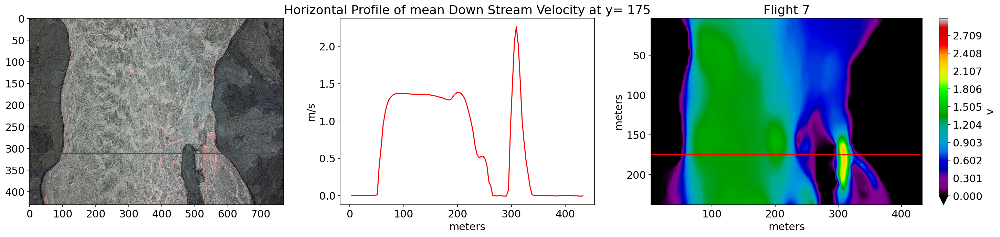

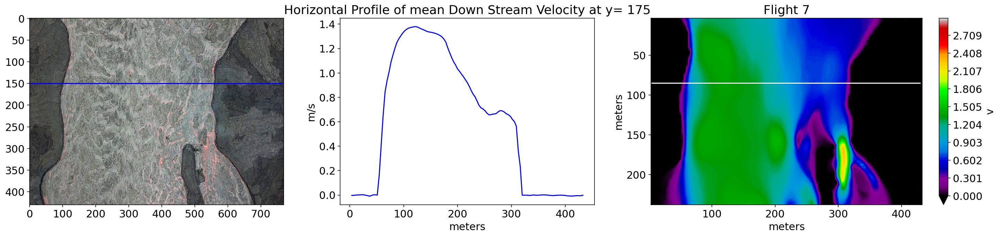

In [116]:
Cross = F07.v.mean(dim='time').sel(y=175, method='nearest')

fig,ax = plt.subplots(1,3,figsize=(25,5), gridspec_kw={'width_ratios': [3, 3, 4]})
ax[0].imshow(frame_F7,  aspect='auto')
ax[0].hlines(1554*Resize, 0, 3830*Resize, colors='red')

Cross.plot(ax=ax[1], color='red')
ax[1].set_title('Horizontal Profile of mean Down Stream Velocity at y= 175')
ax[1].set_ylabel('m/s')
ax[1].set_xlabel('meters')


F07.v.mean(dim='time').transpose().plot.contourf(levels=300, vmin=0, vmax=3, cmap=cm.nipy_spectral, ax=ax[2], yincrease=False)
ax[2].set_title('Flight 7')
ax[2].hlines(175, 4, 430, colors='red')
ax[2].set_xlabel('meters')
ax[2].set_ylabel('meters')

Cross2 = F07.v.mean(dim='time').sel(y=85, method='nearest')
fig2,ax = plt.subplots(1,3,figsize=(25,5), gridspec_kw={'width_ratios': [3, 3, 4]})
ax[0].imshow(frame_F7, aspect='auto')
ax[0].hlines(750*Resize, 0, 3830*Resize, colors='blue')

Cross2.plot(ax=ax[1], color='blue')
ax[1].set_title('Horizontal Profile of mean Down Stream Velocity at y= 175')
ax[1].set_ylabel('m/s')
ax[1].set_xlabel('meters')


F07.v.mean(dim='time').transpose().plot.contourf(levels=300, vmin=0, vmax=3, cmap=cm.nipy_spectral, ax=ax[2], yincrease=False)
ax[2].set_title('Flight 7')
ax[2].hlines(85, 4, 430, colors='white')
ax[2].set_xlabel('meters')
ax[2].set_ylabel('meters')

## Width Calculations

The width at yellow line : 311.9756582604344 m
The width at cyan line : 262.5368927437535 m
The width at orange line : 204.80150680703196 m
The width at red line : 37.505270391964785 m
The width at white line : 28.413083630276354 m


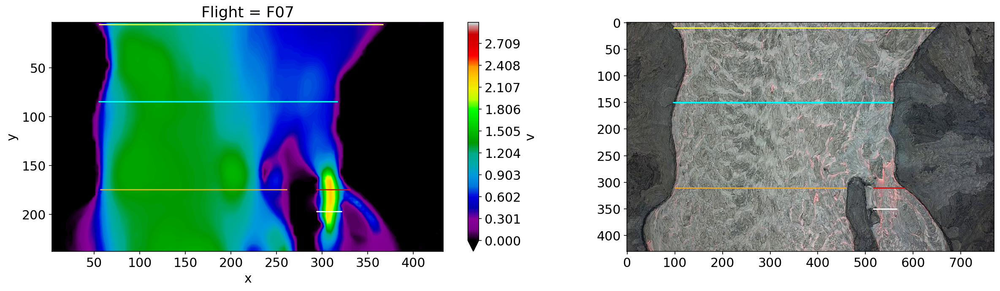

In [118]:
fig,ax = plt.subplots(1,2,figsize=(20,5), gridspec_kw={'width_ratios': [4, 3]})

F07.v.mean(dim='time').transpose().plot.contourf(levels=300, vmin=0, vmax=3, cmap=cm.nipy_spectral, yincrease=False, ax=ax[0])

ax[0].hlines(50 *GSDy, 485 *GSDx, 3230 *GSDx, colors='yellow')
Yellow_W = (3230-485)*GSDx
print('The width at yellow line :' , Yellow_W , 'm')

ax[0].hlines(750*GSDy, 480*GSDx, 2790*GSDx, colors='cyan')
Cyan_W = (2790-480) *GSDx
print('The width at cyan line :' , Cyan_W  , 'm')

ax[0].hlines(1550 *GSDy, 498 *GSDx, 2300 *GSDx, colors='orange')
Orange_W = (2300-498)*GSDx
print('The width at orange line :' , Orange_W, 'm')

ax[0].hlines(1550 *GSDy, 2580 *GSDx, 2910 *GSDx, colors='red')
Red_W = (2910-2580)*GSDx
print('The width at red line :' , Red_W , 'm')

ax[0].hlines(1750 *GSDy, 2580 *GSDx, 2830 *GSDx, colors='w')
White_W = (2830-2580)*GSDx
print('The width at white line :' , White_W , 'm')

# Plot the original image
ax[1].imshow(frame_F7, aspect='auto')
ax[1].hlines(50*Resize, 485*Resize , 3230*Resize, colors='yellow')
ax[1].hlines(750*Resize, 480*Resize, 2790*Resize, colors='cyan')
ax[1].hlines(1550*Resize, 498*Resize, 2300*Resize , colors='orange')
ax[1].hlines(1550*Resize , 2580*Resize , 2910*Resize , colors='red')
ax[1].hlines(1750*Resize , 2580*Resize , 2830*Resize , colors='w')


### Calculate the velocity at each line

In [119]:
Yellow = F07.mean(dim='time').sel(y= 50 *GSDy, method='nearest')
Yellow = Yellow.v.sel(x=slice(485 *GSDx, 3230 *GSDx))

Cyan = F07.mean(dim='time').sel( y=85, method='nearest')
Cyan = Cyan.v.sel(x=slice(55, 317))

Orange = F07.mean(dim='time').sel( y=1550 *GSDy, method='nearest')
Orange = Orange.v.sel(x=slice(498 *GSDx, 2300 *GSDx))

Red = F07.mean(dim='time').sel( y=1550 *GSDy, method='nearest')
Red = Red.v.sel(x=slice(2580 *GSDx, 2910 *GSDx))

White = F07.mean(dim='time').sel(y= 1750 *GSDy, method='nearest')
White = White.v.sel(x=slice(2580 *GSDx, 2830 *GSDx))


In [120]:
Width_V_Means = (Yellow.mean(), Cyan.mean(), Orange.mean(), Red.mean(), White.mean())
Width_V_Means = np.array(Width_V_Means)

Width_V_Max = (Yellow.max(), Cyan.max(), Orange.max(), Red.max(), White.max())
Width_V_Max = np.array(Width_V_Max)

Widths = (Yellow_W, Cyan_W, Orange_W, Red_W, White_W)
Widths = np.array(Widths)

In [121]:
Width_V_stdv = (Yellow.std(), Cyan.std(), Orange.std(), Red.std(), White.std())
Width_V_stdv = np.array(Width_V_stdv)


y = -0.0014274892529119346 x + 1.3433585765040135


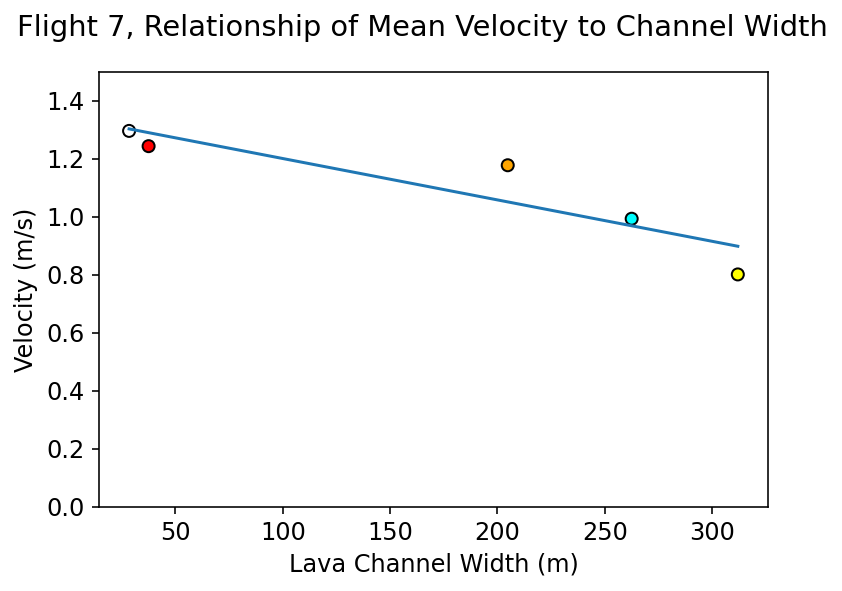

In [125]:
plt.rcParams.update({'font.size': 12})

plt.scatter(Widths, Width_V_Means, edgecolor='k', c=('yellow', 'cyan', 'orange', 'red', 'w'))
plt.ylim(0,1.5)
plt.suptitle('Flight 7, Relationship of Mean Velocity to Channel Width')
plt.xlabel("Lava Channel Width (m)")
plt.ylabel('Velocity (m/s)')
m, b = np.polyfit(Widths, Width_V_Means, 1)
plt.plot(Widths, m*Widths + b)
print('y =',m,'x +',b)

We see a slightly negative correlation between channel width and mean velocity (given these limited data points).

y = -0.003680712892044425 x + 2.3281573130065407


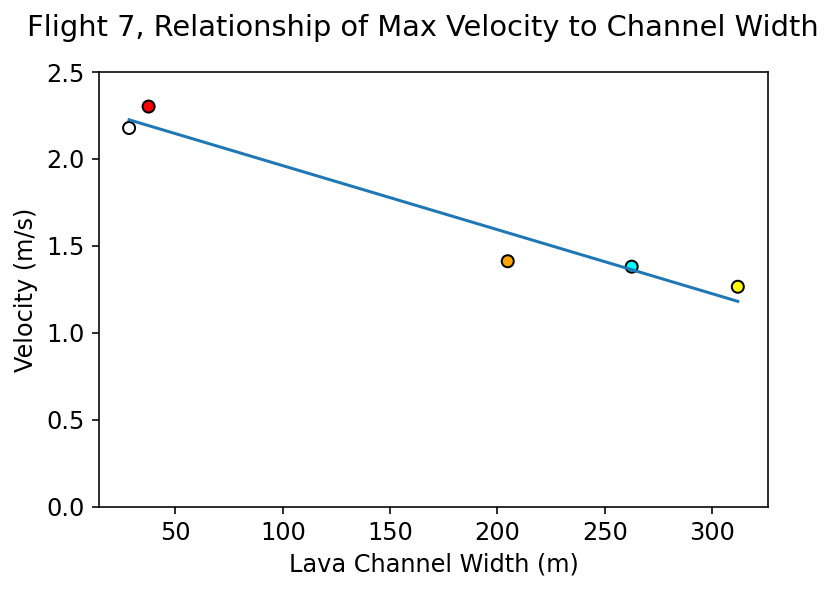

In [128]:
plt.scatter(Widths, Width_V_Max, edgecolor='k', c=('yellow', 'cyan', 'orange', 'red', 'w'))
plt.ylim(0,2.5)
plt.suptitle('Flight 7, Relationship of Max Velocity to Channel Width')
plt.xlabel("Lava Channel Width (m)")
plt.ylabel('Velocity (m/s)')
mMax, bMax = np.polyfit(Widths, Width_V_Max, 1)
plt.plot(Widths, mMax*Widths + bMax)
print('y =',mMax,'x +',bMax)

Here we see a slightly stronger negative correlation between channel width and max velocity (again given these limited data points).

y = -0.0014274892529119346 x + 1.3433585765040135


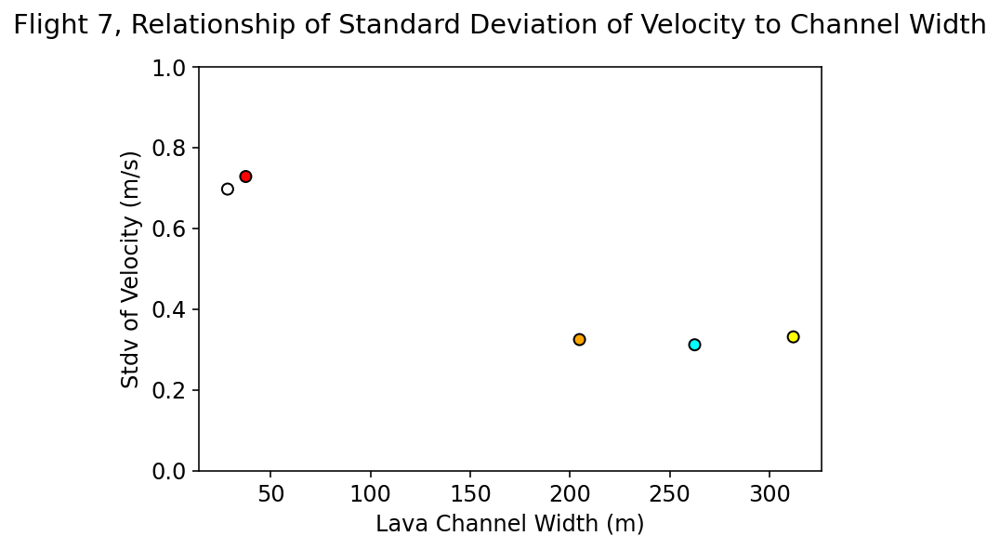

In [131]:
plt.scatter(Widths, Width_V_stdv, edgecolor='k', c=('yellow', 'cyan', 'orange', 'red', 'w'))
plt.ylim(0,1)
plt.suptitle('Flight 7, Relationship of Standard Deviation of Velocity to Channel Width')
plt.xlabel("Lava Channel Width (m)")
plt.ylabel('Stdv of Velocity (m/s)')
#m, b = np.polyfit(Widths, Width_V_stdv, 1)
#plt.plot(Widths, m*Widths + b)
print('y =',m,'x +',b)

The wider channel has a lower standard deviation on average then the smaller channel

## Animations
### Script 4_Xarray_To_GIF : used to produce GIFs from Xarray

### Display GIF's

In [28]:
#Flight 7 GIF
Image(url= "https://static.wixstatic.com/media/066c76_03076b2424894229975cf6705199f214~mv2.gif",  width=700, height=500)

In [29]:
#Flight 8 GIF
Image(url= "https://static.wixstatic.com/media/066c76_eb12b760154d4e6d8a669f39e1a4931c~mv2.gif",  width=700, height=500)

In [30]:
#Flight 9 GIF
Image(url= "https://static.wixstatic.com/media/066c76_c3772ec4475b483cbc8cd4d28032da01~mv2.gif",  width=700, height=500)

In [31]:
#Flight 10 GIF
Image(url= "https://static.wixstatic.com/media/066c76_b12d6ea5c72a419abeef1d23b57526c0~mv2.gif",  width=700, height=500)


# Some Lessons learned
- What was the average speed of the lava flow?
    - The large channel had an average total velocity (s) of 1.27 m/s, a down stream(v) of 1.26 m/s and  cross stream of 0.05 m/s (to the left). 
    - The smaller channel had an average total velocity (s) of 1.35 m/s.
- Over the course of aproximatly 3.5 hours did flow velocity change signifigantly?
    - There was some velocity variations, but likely within the expected error bars using PIV. The overall averge speed of each flight in order was 0.65, 0.71 , 0.75, 0.79 m/s indicating througout the course of the about 3.5 hours, the channel increased in speed on average. 
- How did the channel width affect flow speeds?
    - Plots above show a slightly negative correlation between lava channel width and mean and max channel velocity.

##  Supplemental Analysis
Not Part of Presentation

### Overall Average Velocity (including 'still regions') for each Flight

In [135]:
dfx.s.mean(dim='time').mean(dim='x').mean(dim='y')

<xarray.DataArray 's' (Flight: 4)>
array([0.65215521, 0.7147174 , 0.74601323, 0.79388776])
Coordinates:
  * Flight   (Flight) object 'F07' 'F08' 'F09' 'F10'

### Overall Average Down Stream Velocity (including 'still regions') for each Flight

In [136]:
dfx.v.mean(dim='time').mean(dim='x').mean(dim='y')

<xarray.DataArray 'v' (Flight: 4)>
array([0.61800276, 0.67903013, 0.71495967, 0.75698795])
Coordinates:
  * Flight   (Flight) object 'F07' 'F08' 'F09' 'F10'

### Velocity Distributions per Flight

Text(0.5, 1.0, 'Flight 10')

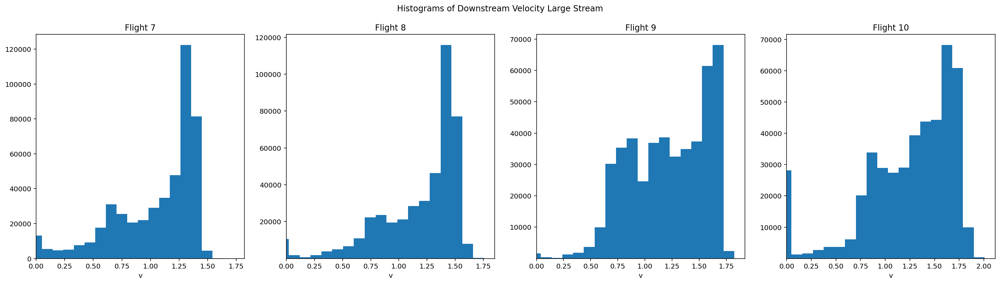

In [137]:

fig, axes = plt.subplots(figsize=(25, 6), ncols=4)
ax1, ax2, ax3, ax4 = axes

plt.suptitle("Histograms of Downstream Velocity Large Stream")

F07.v.sel(x=slice(50,270)).plot.hist(xlim=0, ax=ax1, bins=20  )
ax1.set_title('Flight 7')

F08.v.sel(x=slice(50,250)).plot.hist(xlim=0, ylim=3, ax=ax2, bins=20 )
ax2.set_title('Flight 8')

F09.v.sel(x=slice(50,260)).plot.hist(xlim=-0, ylim=3, ax=ax3, bins=20  )
ax3.set_title('Flight 9')

F10.v.sel(x=slice(60,270)).plot.hist(xlim=0, ylim=3, ax=ax4, bins=20  )
ax4.set_title('Flight 10')


Text(0.5, 1.0, 'Flight 10')

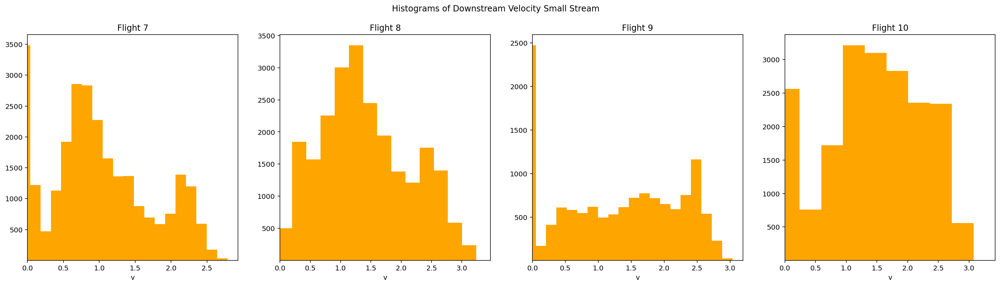

In [138]:
# Which flight recorded the fastest flowing lava
fig, axes = plt.subplots(figsize=(25, 6), ncols=4)
ax1, ax2, ax3, ax4 = axes

plt.suptitle("Histograms of Downstream Velocity Small Stream")

F07.v.sel(x=slice(290,320), y=slice(140,250)).plot.hist(xlim=0, ylim=2, ax=ax1, bins=20, color='orange'  )
ax1.set_title('Flight 7')

F08.v.sel(x=slice(290,315), y=slice(140,250)).plot.hist(xlim=0, ylim=3, ax=ax2, bins=20, color='orange' )
ax2.set_title('Flight 8')

F09.v.sel(x=slice(300,320), y= slice(160,250)).plot.hist(xlim=-0, ylim=3, ax=ax3, bins=20, color='orange'  )
ax3.set_title('Flight 9')

F10.v.sel(x=slice(320,350), y=slice(175,250)).plot.hist(xlim=0, ylim=3, ax=ax4, bins=20, color='orange'  )
ax4.set_title('Flight 10')



### Some Measurments

In [139]:
#Average velocity of the flow
bigflow =dfx.sel(x=slice(70,250))
print('Mean', bigflow.mean())
print('Standard Deviation', bigflow.std())
print('Max', bigflow.max() )
print('Min', bigflow.min())


Mean <xarray.Dataset>
Dimensions:  ()
Data variables:
    u        float64 -0.05095
    v        float64 1.257
    s        float64 1.274
Standard Deviation <xarray.Dataset>
Dimensions:  ()
Data variables:
    u        float64 0.1861
    v        float64 0.3314
    s        float64 0.3218
Max <xarray.Dataset>
Dimensions:  ()
Data variables:
    u        float64 1.179
    v        float64 2.006
    s        float64 2.008
Min <xarray.Dataset>
Dimensions:  ()
Data variables:
    u        float64 -0.8145
    v        float64 -0.1596
    s        float64 0.0005225


- The average flow for all the flights was about 1.26 m/s 


In [140]:
#Small Channel Mean Velocity

S7= F07.s.sel(x=slice(290,320), y=slice(140,250)).mean().values
S8= F08.s.sel(x=slice(290,315), y=slice(140,250)).mean().values
S9= F09.s.sel(x=slice(300,320), y= slice(160,250)).mean().values
S10= F10.s.sel(x=slice(320,350), y=slice(175,250)).mean().values
print('Mean Velocity of small channel in flights order: ', S7,S8,S9,S10, ' (m/s)')
S_avg = (S7+S8+S9+S10)/4
print('Overall Mean Velocity of Small Channel for all flights: ', S_avg, 'm/s')

Mean Velocity of small channel in flights order:  1.0247138538494531 1.454812786939765 1.381598379557666 1.5277278852103449  (m/s)
Overall Mean Velocity of Small Channel for all flights:  1.3472132263893073 m/s
